# module import

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import os

from PIL import Image
from IPython.display import Image as Img, display
from math import ceil
from collections import deque
from tqdm import tqdm

# basic information for simulation

In [2]:
# from 00, 01 ipynb files
converted_nodes = [{'id': 0, 'type': 'H', 'coords': (10, 10)}, {'id': 1, 'type': 'I', 'coords': (5, 8)}, {'id': 2, 'type': 'S', 'coords': (7, 2)}, {'id': 3, 'type': 'C', 'coords': (6, 0)}, {'id': 4, 'type': 'S', 'coords': (2, 7)}, {'id': 5, 'type': 'C', 'coords': (5, 0)}, {'id': 6, 'type': 'S', 'coords': (2, 2)}, {'id': 7, 'type': 'I', 'coords': (4, 9)}, {'id': 8, 'type': 'O', 'coords': (1, 1)}, {'id': 9, 'type': 'C', 'coords': (5, 1)}, {'id': 10, 'type': 'R', 'coords': (7, 1)}, {'id': 11, 'type': 'R', 'coords': (9, 3)}, {'id': 12, 'type': 'I', 'coords': (4, 8)}, {'id': 13, 'type': 'S', 'coords': (7, 7)}, {'id': 14, 'type': 'C', 'coords': (8, 4)}, {'id': 15, 'type': 'O', 'coords': (2, 1)}, {'id': 16, 'type': 'R', 'coords': (8, 1)}, {'id': 17, 'type': 'R', 'coords': (8, 2)}, {'id': 18, 'type': 'C', 'coords': (1, 3)}, {'id': 19, 'type': 'R', 'coords': (9, 4)}]
converted_edges = [{'start': 0, 'end': 7, 'distance': 12.165525060596439, 'road_type': 'urban'}, {'start': 7, 'end': 0, 'distance': 12.165525060596439, 'road_type': 'urban'}, {'start': 1, 'end': 12, 'distance': 2.0, 'road_type': 'urban'}, {'start': 12, 'end': 1, 'distance': 2.0, 'road_type': 'urban'}, {'start': 2, 'end': 6, 'distance': 10.0, 'road_type': 'highway'}, {'start': 6, 'end': 2, 'distance': 10.0, 'road_type': 'highway'}, {'start': 2, 'end': 13, 'distance': 10.0, 'road_type': 'highway'}, {'start': 13, 'end': 2, 'distance': 10.0, 'road_type': 'highway'}, {'start': 2, 'end': 17, 'distance': 2.0, 'road_type': 'urban'}, {'start': 17, 'end': 2, 'distance': 2.0, 'road_type': 'urban'}, {'start': 3, 'end': 5, 'distance': 2.0, 'road_type': 'urban'}, {'start': 5, 'end': 3, 'distance': 2.0, 'road_type': 'urban'}, {'start': 4, 'end': 6, 'distance': 10.0, 'road_type': 'highway'}, {'start': 6, 'end': 4, 'distance': 10.0, 'road_type': 'highway'}, {'start': 4, 'end': 7, 'distance': 5.656854249492381, 'road_type': 'urban'}, {'start': 7, 'end': 4, 'distance': 5.656854249492381, 'road_type': 'urban'}, {'start': 4, 'end': 13, 'distance': 10.0, 'road_type': 'highway'}, {'start': 13, 'end': 4, 'distance': 10.0, 'road_type': 'highway'}, {'start': 5, 'end': 6, 'distance': 7.211102550927978, 'road_type': 'urban'}, {'start': 6, 'end': 5, 'distance': 7.211102550927978, 'road_type': 'urban'}, {'start': 5, 'end': 9, 'distance': 2.0, 'road_type': 'urban'}, {'start': 9, 'end': 5, 'distance': 2.0, 'road_type': 'urban'}, {'start': 5, 'end': 15, 'distance': 6.324555320336759, 'road_type': 'urban'}, {'start': 15, 'end': 5, 'distance': 6.324555320336759, 'road_type': 'urban'}, {'start': 5, 'end': 17, 'distance': 7.211102550927978, 'road_type': 'urban'}, {'start': 17, 'end': 5, 'distance': 7.211102550927978, 'road_type': 'urban'}, {'start': 6, 'end': 15, 'distance': 2.0, 'road_type': 'urban'}, {'start': 15, 'end': 6, 'distance': 2.0, 'road_type': 'urban'}, {'start': 6, 'end': 18, 'distance': 2.8284271247461903, 'road_type': 'urban'}, {'start': 18, 'end': 6, 'distance': 2.8284271247461903, 'road_type': 'urban'}, {'start': 7, 'end': 12, 'distance': 2.0, 'road_type': 'urban'}, {'start': 12, 'end': 7, 'distance': 2.0, 'road_type': 'urban'}, {'start': 8, 'end': 15, 'distance': 2.0, 'road_type': 'urban'}, {'start': 15, 'end': 8, 'distance': 2.0, 'road_type': 'urban'}, {'start': 10, 'end': 16, 'distance': 2.0, 'road_type': 'urban'}, {'start': 16, 'end': 10, 'distance': 2.0, 'road_type': 'urban'}, {'start': 10, 'end': 17, 'distance': 2.8284271247461903, 'road_type': 'urban'}, {'start': 17, 'end': 10, 'distance': 2.8284271247461903, 'road_type': 'urban'}, {'start': 11, 'end': 19, 'distance': 2.0, 'road_type': 'urban'}, {'start': 19, 'end': 11, 'distance': 2.0, 'road_type': 'urban'}, {'start': 13, 'end': 14, 'distance': 6.324555320336759, 'road_type': 'urban'}, {'start': 14, 'end': 13, 'distance': 6.324555320336759, 'road_type': 'urban'}, {'start': 14, 'end': 17, 'distance': 4.0, 'road_type': 'urban'}, {'start': 17, 'end': 14, 'distance': 4.0, 'road_type': 'urban'}, {'start': 14, 'end': 18, 'distance': 14.142135623730951, 'road_type': 'urban'}, {'start': 18, 'end': 14, 'distance': 14.142135623730951, 'road_type': 'urban'}, {'start': 14, 'end': 19, 'distance': 2.0, 'road_type': 'urban'}, {'start': 19, 'end': 14, 'distance': 2.0, 'road_type': 'urban'}, {'start': 15, 'end': 17, 'distance': 12.165525060596439, 'road_type': 'urban'}, {'start': 17, 'end': 15, 'distance': 12.165525060596439, 'road_type': 'urban'}]

adj = [[0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0.],
 [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0.],
 [0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0.],
 [1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.],
 [0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1.],
 [0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0.],
 [0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0.],
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0.]]

random_prob = {'R': 0.16,
               'I': 0.1,
               'C': 0.1,
               'O': 0.1,
               'H': 0.3,
               'S': 0.0,
               'day_night_ratio':0.25,
               'step_of_visit':10}

edge_idx_map = {(0, 7): 0, (7, 0): 1, (1, 12): 2, (12, 1): 3, (2, 6): 4, (6, 2): 5, (2, 13): 6, (13, 2): 7, (2, 17): 8, (17, 2): 9, (3, 5): 10, (5, 3): 11, (4, 6): 12, (6, 4): 13, (4, 7): 14, (7, 4): 15, (4, 13): 16, (13, 4): 17, (5, 6): 18, (6, 5): 19, (5, 9): 20, (9, 5): 21, (5, 15): 22, (15, 5): 23, (5, 17): 24, (17, 5): 25, (6, 15): 26, (15, 6): 27, (6, 18): 28, (18, 6): 29, (7, 12): 30, (12, 7): 31, (8, 15): 32, (15, 8): 33, (10, 16): 34, (16, 10): 35, (10, 17): 36, (17, 10): 37, (11, 19): 38, (19, 11): 39, (13, 14): 40, (14, 13): 41, (14, 17): 42, (17, 14): 43, (14, 18): 44, (18, 14): 45, (14, 19): 46, (19, 14): 47, (15, 17): 48, (17, 15): 49}
node_idx_map = {0: (0, 7), 1: (7, 0), 2: (1, 12), 3: (12, 1), 4: (2, 6), 5: (6, 2), 6: (2, 13), 7: (13, 2), 8: (2, 17), 9: (17, 2), 10: (3, 5), 11: (5, 3), 12: (4, 6), 13: (6, 4), 14: (4, 7), 15: (7, 4), 16: (4, 13), 17: (13, 4), 18: (5, 6), 19: (6, 5), 20: (5, 9), 21: (9, 5), 22: (5, 15), 23: (15, 5), 24: (5, 17), 25: (17, 5), 26: (6, 15), 27: (15, 6), 28: (6, 18), 29: (18, 6), 30: (7, 12), 31: (12, 7), 32: (8, 15), 33: (15, 8), 34: (10, 16), 35: (16, 10), 36: (10, 17), 37: (17, 10), 38: (11, 19), 39: (19, 11), 40: (13, 14), 41: (14, 13), 42: (14, 17), 43: (17, 14), 44: (14, 18), 45: (18, 14), 46: (14, 19), 47: (19, 14), 48: (15, 17), 49: (17, 15)}

river_info = (np.array([ 0.        ,  2.5       ,  3.33333333,  6.66666667,  7.5       ,
       10.        ]), np.array([6.86811936, 6.86811936, 6.45145269, 6.45145269, 6.03478602,
       6.03478602]), 1.6977288245972708)

# main simulation class

In [3]:
class Vehicle_12:
    def __init__(self, vid, route_type, path_out, departure_time,
                 origin_node, dest_node, step_of_visit):
        self.id = vid
        self.reset(route_type, path_out, departure_time,
                   origin_node, dest_node, step_of_visit)
        self.dt = None
        self.history = []

    def reset(self, route_type, path_out, departure_time,
              origin_node, dest_node, step_of_visit):
        """initialize internal state when used in simulation class"""
        self.route_type     = route_type
        self.path           = path_out
        self.departure_time = departure_time
        self.origin_node    = origin_node
        self.dest_node      = dest_node
        self.step_of_visit  = step_of_visit

        self.current_link_index = 0
        self.remaining_steps    = path_out[0]['basic_steps'] if path_out else 0

        self.phase        = "outbound"
        self.finished     = False
        self.returned     = False
        self.waiting_steps= 0

    def get_current_link(self):
        return self.path[self.current_link_index] if self.current_link_index < len(self.path) else None

    def get_current_location(self):
        info = f"Vehicle {self.id} | {self.route_type} | "
        if self.returned:
            return info + f"[Returned] Origin {self.origin_node}"
        if self.phase == "waiting":
            return info + f"[Waiting at {self.dest_node} (remain={self.waiting_steps})]"
        if self.finished:
            if self.path:
                final = self.path[-1]['end']
                return info + (f"[Returned] Node {final}" if self.phase=="returning" else f"[Arrived] Node {final}")
            return info + "[Arrived with empty path]"
        link = self.get_current_link()
        if link and self.remaining_steps > 0:
            return info + f"Edge {link['start']}->{link['end']} (remain={self.remaining_steps})"
        return info + "[Transition]"

    def step(self, t, simulation):
        if t < self.departure_time or self.returned:
            self.history.append(self.get_current_location())
            return
        if self.phase in ["outbound", "returning"]:
            self._move_path(t, simulation)
        elif self.phase == "waiting":
            if self.waiting_steps > 0:
                self.waiting_steps -= 1
        self.history.append(self.get_current_location())

    def _move_path(self, t, simulation):
        if self.finished:
            return
        if self.remaining_steps == 0:
            self.current_link_index += 1
            if self.current_link_index < len(self.path):
                link = self.path[self.current_link_index]
                eff, _ = simulation.compute_effective_steps(link, t)
                self.dt = eff
                self.remaining_steps = eff
            else:
                self.finished = True
                return
        if self.remaining_steps > 0:
            self.remaining_steps -= 1


class SimpleSimulation_13:
    def __init__(self, converted_nodes, converted_edges, random_prob,
                 timestep_minutes=1, basic_spawn_count=5, num_days=2,
                 start_day="mon", basic_interval=10):
        # node, edges info
        self.nodes = converted_nodes
        self.edges = self.add_travel_time_to_edges(converted_edges, timestep_minutes)
        self.random_prob = random_prob
        self.step_of_visit = random_prob.get('step_of_visit', 10)
        self.basic_spawn_count = basic_spawn_count
        self.basic_interval = basic_interval

        # num edges
        self.E = len(self.edges)
        # edge index mapping: (u,v) -> idx
        self.edge_index_map = {(e['start'], e['end']): i for i, e in enumerate(self.edges)}
        # channels: (vol, density, flow)
        self.C = 3

        # simulation setting
        self.steps_per_day = 480  # 8 hours is one day (for simplification)
        self.num_days = num_days
        self.timestep_minutes = timestep_minutes
        self.total_timesteps = self.steps_per_day * self.num_days

        # traffic_data: (T, E, C)
        self.traffic_data = np.zeros((self.total_timesteps, self.E, self.C), dtype=float)

        # graph
        self.G = nx.DiGraph()
        for idx, e in enumerate(self.edges):
            u, v = e['start'], e['end']
            self.G.add_edge(u, v, weight=e['basic_steps'], link_data=e)

        # Vehicle pool
        self.vehicle_pool = deque()
        self.vehicles = []
        self.next_vid = 0

        # day of week setting
        self.days = ["mon", "tue", "wed", "thu", "fri", "sat", "sun"]
        self.start_day_index = self.days.index(start_day)
        self.weekend_multiplier = 1.25 # more random vehicles are spawned on the weekend

    def add_travel_time_to_edges(self, edges, timestep_minutes):
        out = []
        for e in edges:
            d = e['distance']
            speed = 100 if e['road_type'] == 'highway' else 60
            tm = d * (60 / speed)
            steps = max(1, ceil(tm / timestep_minutes))
            ne = e.copy()
            ne['basic_steps'] = steps
            out.append(ne)
        return out

    def get_current_weekday(self, t):
        idx = (self.start_day_index + t // self.steps_per_day) % 7
        return self.days[idx]

    def acquire_vehicle(self, route_type, path_out, departure_time,
                        origin_node, dest_node, step_of_visit):
        if self.vehicle_pool:
            v = self.vehicle_pool.popleft()
            v.reset(route_type, path_out, departure_time,
                    origin_node, dest_node, step_of_visit)
        else:
            v = Vehicle_12(self.next_vid, route_type, path_out,
                           departure_time, origin_node, dest_node, step_of_visit)
            self.next_vid += 1
            self.vehicles.append(v)
        return v

    def get_shortest_path_links(self, s, t):
        try:
            path = nx.dijkstra_path(self.G, s, t, weight='weight')
        except nx.NetworkXNoPath:
            return []
        links = []
        for i in range(len(path) - 1):
            links.append(self.G[path[i]][path[i+1]]['link_data'])
        return links

    def compute_effective_steps(self, link, t):
        u, v = link['start'], link['end']
        bs = link['basic_steps']
        dist = link['distance']
        lanes = 4 if link['road_type'] == 'highway' else 2
        # 현재 볼륨
        idx = self.edge_index_map[(u, v)]
        vol = self.traffic_data[t, idx, 0]
        density = vol / (dist * lanes) if dist * lanes > 0 else 0
        kmax = 130 if link['road_type'] == 'highway' else 35
        eff = round(bs * (1 + 0.15 * ((density / kmax) ** 4)))
        return eff, density

    def record_traffic(self, t):
        # 1) Volume per each vehicle
        for v in self.vehicles:
            if v.returned or t < v.departure_time:
                continue
            link = v.get_current_link()
            if link and not v.finished:
                idx = self.edge_index_map[(link['start'], link['end'])]
                self.traffic_data[t, idx, 0] += 1  # volume

        # 2) calculate Density & Flow for each vehicle
        for idx, e in enumerate(self.edges):
            vol = self.traffic_data[t, idx, 0]
            dist = e['distance']
            lanes = 4 if e['road_type']=='highway' else 2

            # density = volume / (distance * lanes)
            density = vol / (dist * lanes) if dist*lanes>0 else 0

            # avg speed = freeflow_speed (distance*60/basic_steps)
            # flow = density * speed
            speed = (dist * 60) / e['basic_steps'] if e['basic_steps']>0 else 0
            flow = density * speed

            self.traffic_data[t, idx, 1] = density
            self.traffic_data[t, idx, 2] = flow

    def spawn_commute_basic(self, t, rng):
        if self.get_current_weekday(t) in ("sat", "sun"): return
        half = self.basic_interval // 2
        for nd in self.nodes:
            if nd['type'] != 'R': continue
            base = (t // self.steps_per_day) * self.steps_per_day
            scheduled = base + 60
            if scheduled - half <= t <= scheduled + half:
                interval = float(self.basic_interval)
                for k in range(self.basic_spawn_count):
                    offset = -half + (k + 0.5) * (interval / self.basic_spawn_count)
                    st = int(round(scheduled + offset))
                    if t != st: continue
                    ico = [x['id'] for x in self.nodes if x['type'] in ['I', 'C', 'O']]
                    if not ico: continue
                    dest = int(rng.choice(ico))
                    path = self.get_shortest_path_links(nd['id'], dest)
                    if not path: continue
                    self.acquire_vehicle("basic_commute", path, t,
                                         nd['id'], dest, self.step_of_visit)

    def spawn_industrial_basic(self, t, rng):
        if self.get_current_weekday(t) in ("sat", "sun"): return
        half = self.basic_interval // 2
        for nd in self.nodes:
            if nd['type'] != 'I': continue
            base = (t // self.steps_per_day) * self.steps_per_day
            scheduled = base + 30
            if scheduled - half <= t <= scheduled + half:
                interval = float(self.basic_interval)
                for k in range(self.basic_spawn_count):
                    offset = -half + (k + 0.5) * (interval / self.basic_spawn_count)
                    st = int(round(scheduled + offset))
                    if t != st: continue
                    cns = [x['id'] for x in self.nodes if x['type'] == 'C']
                    if not cns: continue
                    dest = int(rng.choice(cns))
                    path = self.get_shortest_path_links(nd['id'], dest)
                    if not path: continue
                    self.acquire_vehicle("basic_industrial", path, t,
                                         nd['id'], dest, self.step_of_visit)

    def spawn_hub_basic(self, t, rng):
        if self.get_current_weekday(t) in ("sat", "sun"): return
        half = self.basic_interval // 2
        for nd in self.nodes:
            if nd['type'] != 'H': continue
            base = (t // self.steps_per_day) * self.steps_per_day
            scheduled = base + 30
            if scheduled - half <= t <= scheduled + half:
                interval = float(self.basic_interval)
                for k in range(self.basic_spawn_count):
                    offset = -half + (k + 0.5) * (interval / self.basic_spawn_count)
                    st = int(round(scheduled + offset))
                    if t != st: continue
                    ic = [x['id'] for x in self.nodes if x['type'] in ['I', 'C']]
                    if not ic: continue
                    dest = int(rng.choice(ic))
                    path = self.get_shortest_path_links(nd['id'], dest)
                    if not path: continue
                    self.acquire_vehicle("basic_hub", path, t,
                                         nd['id'], dest, self.step_of_visit)

    def spawn_random_demand(self, t, rng):
        rem = t % self.steps_per_day
        is_day = (120 <= rem < 360)
        for nd in self.nodes:
            p = self.random_prob.get(nd['type'], 0)
            if p <= 0: continue
            prob = p if is_day else p * self.random_prob.get('day_night_ratio', 1)
            if self.get_current_weekday(t) in ("sat", "sun"): prob *= self.weekend_multiplier
            if rng.random() < prob:
                cands = [x['id'] for x in self.nodes if x['id'] != nd['id']]
                if not cands: continue
                dest = int(rng.choice(cands))
                path = self.get_shortest_path_links(nd['id'], dest)
                if not path: continue
                self.acquire_vehicle("random", path, t,
                                     nd['id'], dest, self.step_of_visit)

    def run(self):
        rng = np.random.default_rng()
        for t in tqdm(range(self.total_timesteps)):
            self.record_traffic(t)
            for v in self.vehicles: v.step(t, self)
            self.spawn_commute_basic(t, rng)
            self.spawn_industrial_basic(t, rng)
            self.spawn_hub_basic(t, rng)
            self.spawn_random_demand(t, rng)
            # return logic
            day_base = (t // self.steps_per_day) * self.steps_per_day
            for v in list(self.vehicles):
                if v.returned: continue
                if v.phase == "outbound" and v.finished:
                    if v.route_type == "basic_commute":
                        ret_t = day_base + 360
                        v.waiting_steps = max(0, ret_t - t)
                    else:
                        v.waiting_steps = v.step_of_visit
                    v.phase = "waiting"
                if v.phase == "waiting" and v.waiting_steps <= 0:
                    last = v.path[-1]['end']
                    path = self.get_shortest_path_links(last, v.origin_node)
                    if path:
                        v.reset(v.route_type, path, t, v.origin_node, v.origin_node, v.step_of_visit)
                        eff, _ = self.compute_effective_steps(path[0], t)
                        v.dt = eff; v.remaining_steps = eff; v.finished = False; v.phase = "returning"
                    else:
                        v.returned = True; v.phase = "finished"
                        self.vehicle_pool.append(v)
                if v.phase == "returning" and v.finished:
                    v.returned = True; v.phase = "finished"
                    self.vehicle_pool.append(v)
        return self.traffic_data


# dataset generating example

In [4]:
num_days = 70
sim13 = SimpleSimulation_13(converted_nodes, converted_edges, random_prob, timestep_minutes=1, basic_spawn_count=25, num_days=num_days, basic_interval=20)
traffic_dataset_13 = sim13.run()

100%|██████████| 33600/33600 [00:22<00:00, 1462.13it/s]


# plot example

In [5]:
def get_time_info_generalized(time_step, steps_per_day=480, timestep_minutes=1):
    """
    Given a time_step indicating which step in the full simulation,
    return a (day, hour, minute) tuple.
      - steps_per_day: number of steps per day (e.g., 480)
      - timestep_minutes: minutes per step (e.g., 1)
    """
    # Compute the day count
    day = time_step // steps_per_day + 1

    # Compute minutes elapsed within the current day
    minute_of_day = (time_step % steps_per_day) * timestep_minutes

    # Compute hour and minute
    hour = minute_of_day // 60
    minute = minute_of_day % 60

    return day, int(hour), int(minute)


def get_background_color_generalized(time_step, steps_per_day=480):
    """
    Return a background color (gray scale) based on the fraction of the day elapsed.
    - fraction = (time_step % steps_per_day) / steps_per_day
    - fraction < 3/16      : dark (0.3)
    - 3/16 ≤ fraction ≤ 5/16 : fade-in (0.3 → 1.0)
    - 5/16 < fraction < 11/16: bright (1.0)
    - 11/16 ≤ fraction ≤ 13/16: fade-out (1.0 → 0.3)
    - otherwise             : dark (0.3)
    """
    # Fraction of the day that has passed (0.0 to 1.0)
    frac = (time_step % steps_per_day) / steps_per_day

    dark = 0.3
    bright = 1.0

    if frac < 3/16:
        c = dark
    elif frac <= 5/16:
        # Linear interpolation from 3/16 to 5/16
        # normalized: (frac - 3/16) / (2/16) = (16*frac - 3) / 2
        interp = (16 * frac - 3) / 2
        c = dark + interp * (bright - dark)
    elif frac < 11/16:
        c = bright
    elif frac <= 13/16:
        # Linear interpolation (fade-out) from 11/16 to 13/16
        # normalized: (frac - 11/16) / (2/16) = (16*frac - 11) / 2
        interp = (16 * frac - 11) / 2
        c = bright - interp * (bright - dark)
    else:
        c = dark

    return (c, c, c)


def plot_city_directed_traffic(simulation, time_step, river_info,
                               city_size=10, save=False, output_dir='figures'):
    """
    Visualize the traffic as a directed graph for the given simulation and time_step.
    - simulation.traffic_data has shape (T, E, C); we display channel 0 (volume).
    - A full day is simulation.steps_per_day steps (default 480).
    """
    # Time information
    day, hour, minute = get_time_info_generalized(
        time_step, simulation.steps_per_day, timestep_minutes=simulation.timestep_minutes)
    time_str = f"Time Step {time_step} | Day: {day}, {hour:02d}:{minute:02d}"

    # Background color
    bg_color = get_background_color_generalized(time_step, steps_per_day=simulation.steps_per_day)

    # Extract volumes from channel 0
    volumes = simulation.traffic_data[time_step, :, 0]  # shape (E,)

    # Build directed graph and node colors
    G = nx.DiGraph()
    pos = {}
    node_colors = []
    color_mapping = {
        'R': 'lightgreen', 'I': 'yellow', 'C': 'blue',
        'O': 'skyblue', 'S': 'darkgray', 'H': 'orange'
    }
    for nd in simulation.nodes:
        nid = nd['id']
        ntype = nd['type']
        x, y = nd['coords']
        G.add_node(nid)
        pos[nid] = (x, y)
        node_colors.append(color_mapping.get(ntype, 'black'))

    # Prepare edges with widths and labels
    edgelist = []
    widths = []
    labels = {}
    for idx, e in enumerate(simulation.edges):
        u, v = e['start'], e['end']
        G.add_edge(u, v)
        flow = volumes[idx]
        w = 3 if flow >= 1 else 1
        edgelist.append((u, v))
        widths.append(w)
        labels[(u, v)] = f"{int(flow)}" if flow >= 1 else ""

    # Plot setup
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_facecolor(bg_color)
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.3)
    ax.set_xticks(np.arange(0, city_size + 1, 1))
    ax.set_yticks(np.arange(0, city_size + 1, 1))

    # Plot the river
    xs, ys, river_width = river_info
    ax.plot(xs, ys, color='cadetblue', linewidth=river_width * 5, alpha=1.0)

    # Draw directed edges
    nx.draw_networkx_edges(
        G, pos,
        edgelist=edgelist,
        width=widths,
        edge_color='black',
        alpha=0.7,
        arrows=True,
        arrowstyle='->',
        arrowsize=15,
        connectionstyle='arc3, rad=0.1',
        ax=ax
    )
    nx.draw_networkx_edge_labels(
        G, pos,
        edge_labels=labels,
        font_color='black',
        font_size=9,
        label_pos=0.5,
        ax=ax
    )
    # Draw nodes and labels
    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,
        node_size=500,
        edgecolors='black',
        ax=ax
    )
    nx.draw_networkx_labels(
        G, pos,
        font_size=10, font_color='black', font_weight='bold', ax=ax
    )

    plt.title("Directed City Traffic Map", fontsize=16)
    plt.suptitle(time_str, fontsize=12)
    ax.set_xlim(-1, city_size + 1)
    ax.set_ylim(-1, city_size + 1)
    plt.axis('on')

    if save:
        import os
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(
            os.path.join(output_dir, f"{time_step}_directed.png"),
            dpi=300, bbox_inches='tight'
        )
    plt.show()


def plot_city_undirected_traffic(simulation, time_step, river_info,
                                 city_size=10, save=False, output_dir='figures'):
    """
    Visualize the traffic as an undirected graph.
    - Sum channel 0 (volume) for edges u->v and v->u into a single undirected edge.
    """
    # Time info
    day, hour, minute = get_time_info_generalized(
        time_step, simulation.steps_per_day, timestep_minutes=simulation.timestep_minutes)
    time_str = f"Time Step {time_step} | Day: {day}, {hour:02d}:{minute:02d}"
    bg_color = get_background_color_generalized(time_step, steps_per_day=simulation.steps_per_day)

    # Extract volumes channel 0
    volumes = simulation.traffic_data[time_step, :, 0]  # shape (E,)

    # Build undirected graph and node colors
    G = nx.Graph()
    pos = {}
    node_colors = []
    color_mapping = {
        'R': 'lightgreen', 'I': 'yellow', 'C': 'blue',
        'O': 'skyblue', 'S': 'darkgray', 'H': 'orange'
    }
    for nd in simulation.nodes:
        nid = nd['id']
        ntype = nd['type']
        x, y = nd['coords']
        G.add_node(nid)
        pos[nid] = (x, y)
        node_colors.append(color_mapping.get(ntype, 'black'))

    # Sum volumes for each undirected edge key
    edge_sum = {}
    for idx, e in enumerate(simulation.edges):
        u, v = e['start'], e['end']
        key = tuple(sorted((u, v)))
        edge_sum.setdefault(key, 0)
        edge_sum[key] += volumes[idx]

    edgelist = []
    widths = []
    labels = {}
    for (u, v), flow in edge_sum.items():
        G.add_edge(u, v)
        w = 3 if flow >= 1 else 1
        edgelist.append((u, v))
        widths.append(w)
        labels[(u, v)] = f"{int(flow)}" if flow >= 1 else ""

    # Plot setup
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_facecolor(bg_color)
    ax.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.3)
    ax.set_xticks(np.arange(0, city_size + 1, 1))
    ax.set_yticks(np.arange(0, city_size + 1, 1))

    # Plot the river
    xs, ys, river_width = river_info
    ax.plot(xs, ys, color='cadetblue', linewidth=river_width * 5, alpha=1.0)

    # Draw undirected edges and labels
    nx.draw_networkx_edges(
        G, pos,
        edgelist=edgelist,
        width=widths,
        edge_color='black',
        alpha=0.7,
        ax=ax
    )
    nx.draw_networkx_edge_labels(
        G, pos,
        edge_labels=labels,
        font_color='black',
        font_size=9,
        label_pos=0.5,
        ax=ax
    )
    # Draw nodes and labels
    nx.draw_networkx_nodes(
        G, pos,
        node_color=node_colors,
        node_size=500,
        edgecolors='black',
        ax=ax
    )
    nx.draw_networkx_labels(
        G, pos,
        font_size=10, font_color='black', font_weight='bold', ax=ax
    )

    plt.title("Undirected City Traffic", fontsize=14)
    plt.suptitle(time_str, fontsize=11)
    ax.set_xlim(-1, city_size + 1)
    ax.set_ylim(-1, city_size + 1)
    plt.axis('on')

    if save:
        import os
        os.makedirs(output_dir, exist_ok=True)
        plt.savefig(
            os.path.join(output_dir, f"{time_step}_undirected.png"),
            dpi=300, bbox_inches='tight'
        )
    plt.show()


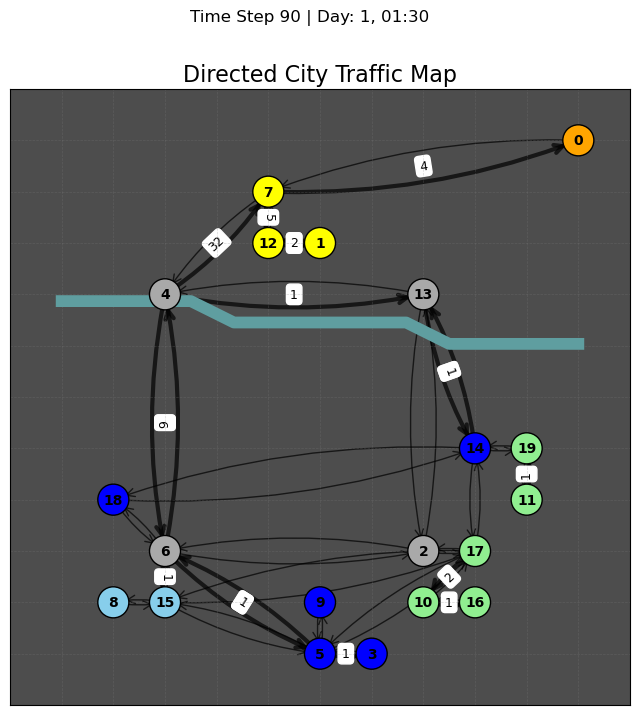

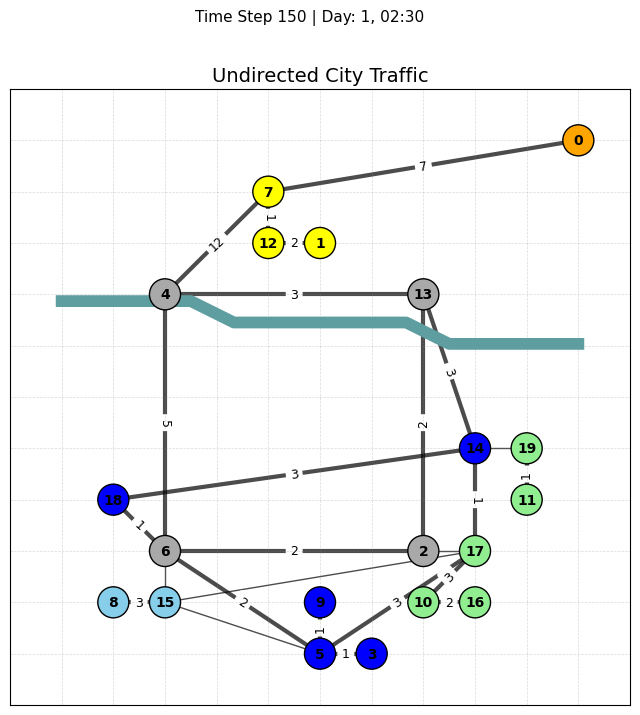

In [6]:
# plot example

time_step_day = 90
plot_city_directed_traffic(sim13, time_step_day, river_info)

time_step_night = 150
plot_city_undirected_traffic(sim13, time_step_night, river_info)

# gif

In [ ]:
# generate_gif
output_dir = "figures"
os.makedirs(output_dir, exist_ok=True)

def generate_gif(path, sim, river_info, num_steps, stride=1, directed=True):
    # 1. figures directory
    os.makedirs(path, exist_ok=True)

    # 2. graph plot & save images
    for step in range(0, num_steps, stride):
        if directed:
            plot_city_directed_traffic(sim, step, river_info, save=True)
        else:
            plot_city_undirected_traffic(sim, step, river_info, save=True)

    # 3. sort: extract number in "{number}_..."
    def extract_index(filename):
        # ex) "12_directed.png" → 12
        name, _ = os.path.splitext(filename)
        return int(name.split('_')[0])

    png_files = [f for f in os.listdir(path) if f.endswith('.png')]
    png_files.sort(key=extract_index)

    # 4. open images
    images = [Image.open(os.path.join(path, f)) for f in png_files]

    # 5. convert & save image as GIF
    gif_path = os.path.join(path, "out.gif")
    images[0].save(gif_path,
                   save_all=True,
                   append_images=images[1:],
                   loop=0,
                   duration=200)

    return Img(filename=gif_path)

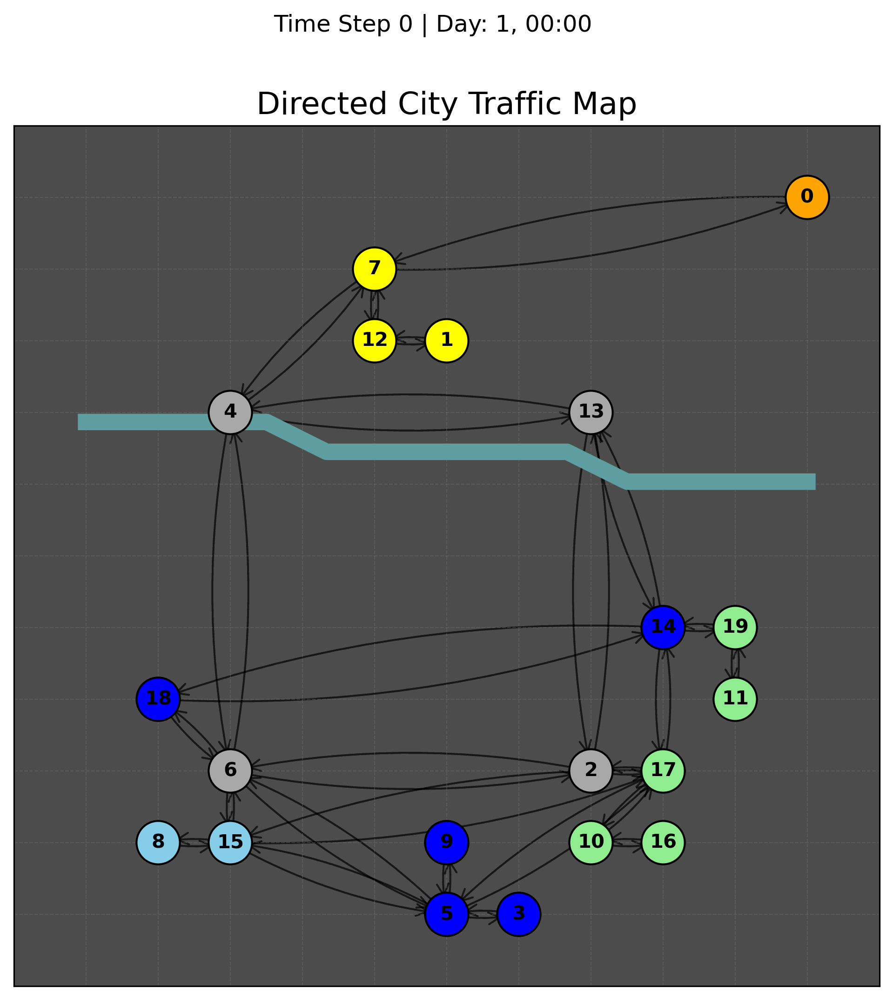

In [12]:
generate_gif(output_dir, sim13, river_info, num_steps=480, stride=3, directed=True)

# smoothening and export

In [ ]:
def causal_movemean_multi(x: np.ndarray, window: int = 20) -> np.ndarray:
    """
    x: (T, E, C)
    window: default = 20
    return: avg time series data as same shape (T, E, C)
    """
    # 1) pad steps before 0 using first step data
    #    shape_pad = (window-1, E, C)
    pad = np.repeat(x[0:1], repeats=window-1, axis=0)
    
    # 2) 패딩 후 누적합
    x_pad = np.concatenate([pad, x], axis=0)        # shape = (T+window-1, E, C)
    cumsum = x_pad.cumsum(axis=0)                   # shape = (T+window-1, E, C)
    
    # 3) moving average
    movemean = (cumsum[window-1:] - cumsum[:-window+1]) / float(window)
    
    return movemean  # shape = (T, E, C)



(33600, 50, 3)
(33600, 50, 3)


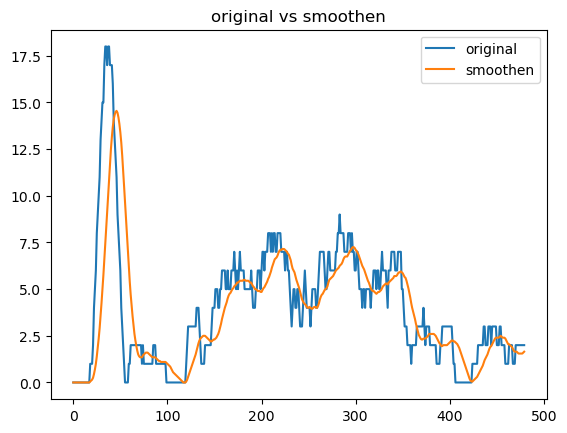

In [ ]:
traffic_dataset_13_smoothen = causal_movemean_multi(traffic_dataset_13, 20)
# np.save('../src/dataset/traffic_dataset_13_smooth.npy', traffic_dataset_13_smoothen, allow_pickle=True)

print(traffic_dataset_13.shape)
print(traffic_dataset_13_smoothen.shape)

start = 0
end = 480
E = 0
C = 0
plt.title('original vs smoothen')
plt.plot(traffic_dataset_13[start:end, E, C], label='original')
plt.plot(traffic_dataset_13_smoothen[start:end, E, C], label='smoothen')
plt.legend()
plt.show()